In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
df = pd.read_pickle('./cleanedLondon.pkl')
df.head()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100
0,95ddefe02c667abc7e449159804acdadd33ab690767e60...,9476162dd80f399d8b8019fe3c33d86ab324ba652be562...,2017-04-23 10:01:47,42987.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 34.039024, 64.84619, 94.783936, 123.9860...","[42.7, 44.000004, 44.231876, 43.991158, 44.148...",[],"[124.0, 165.06412, 172.00883, 189.06175, 184.5...","[1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...","[25.0, 5.67318, 5.403746, 5.265825, 5.166199, ...","[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4..."
1,95e238205210d9410e4fe0ecbab3df223313340a83f3ab...,1d451ca69475b02a540536e6d8303ff0e9a2189fc603af...,2017-04-23 10:02:22,42436.4,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 23.38406, 48.982754, 75.6115, 102.20331,...","[44.2, 44.509953, 43.50354, 42.902058, 42.7556...","[62.0, 100.199394, 96.13578, 96.58066, 95.7775...",[],"[1e-05, 4.088528, 4.540111, 4.395275, 4.337309...","[25.0, 3.896713, 4.082259, 4.200669, 4.258449,...","[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ..."
2,95e4bee9c5287aa9339a15f43f7a7262a827cfcf65a1d7...,912180a889addc1320448dad144b09afb0b2ac8a2e5fdd...,2017-04-23 10:14:24,48148.6,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 43.40611, 79.21527, 113.43089, 146.13931...","[43.9, 44.791477, 44.294205, 43.18896, 42.7954...",[],[],"[1e-05, 10.208913, 3.34587, 3.3863, 4.578401, ...","[25.0, 7.235872, 6.601139, 6.301589, 6.089155,...","[0.0, 9.729244, 3.437359, 3.595867, 4.677167, ..."
3,95e7b6abd37f03f872454c8f136e3d6784080291d53f97...,f71c47c9d4b221081955aad7b74459965704586fe5b7bf...,2017-04-23 10:05:36,43456.8,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 33.455444, 68.01448, 102.50368, 136.4825...","[37.4, 40.867805, 43.891308, 43.17109, 43.6154...",[],[],"[1e-05, 5.621629, 5.758669, 5.595249, 6.005706...","[25.0, 5.573925, 5.667702, 5.694621, 5.686771,...","[0.0, 4.673807, 4.900196, 5.818325, 5.863086, ..."
4,95eac36b06f572c38079051c401d1e0c120bf97162dadd...,0bb8b3565f78de95ea947e6152e580f3887bfeb21c695e...,2017-04-23 09:59:45,43265.7,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 181.76706, 214.09267, 245.91838, 279.538...","[42.0, 42.283722, 43.70605, 44.0, 44.107895, 4...",[],[],"[1e-05, 6.20311, 5.29429, 6.334541, 5.038484, ...","[25.0, 24.999996, 17.841055, 13.662127, 11.647...","[0.0, 6.1086, 4.903893, 6.234581, 5.009134, 4...."


In [3]:
# df['total_marathon_ran'] = df['distance_100'].apply(lambda x: x[-1])
df = df[(df['totaldistance'] > 1000) & (df['totaldistance'] < 43000)]

In [4]:
mean_pace = []
finish_time = []
expected_finish = []
time_diff=[]
status=[]

for idx, row in df.iterrows():
    pace = np.array(row['pace_diff_100'])
    mean_pace.append(pace.mean())
    
    expected_finish.append((pace.mean()*60)*42.2)
    
    time = np.array(row["time_100"])
    finish_time.append(time[-1])
    
    diff = finish_time[-1] - expected_finish[-1] 
    time_diff.append(diff)
    
    if row['totaldistance'] > 42200:
        status.append(1) #finish
    else:
        status.append(0) #dnf
    
df["mean_pace"] = mean_pace
df["finish_time"] = finish_time
df["expected_finish"] = expected_finish
df["time_diff"] = time_diff
df["status"] = status

df.head()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100,mean_pace,finish_time,expected_finish,time_diff,status
0,95ddefe02c667abc7e449159804acdadd33ab690767e60...,9476162dd80f399d8b8019fe3c33d86ab324ba652be562...,2017-04-23 10:01:47,42987.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 34.039024, 64.84619, 94.783936, 123.9860...","[42.7, 44.000004, 44.231876, 43.991158, 44.148...",[],"[124.0, 165.06412, 172.00883, 189.06175, 184.5...","[1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...","[25.0, 5.67318, 5.403746, 5.265825, 5.166199, ...","[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",5.028993,12834.468,12733.409304,101.058696,1
1,95e238205210d9410e4fe0ecbab3df223313340a83f3ab...,1d451ca69475b02a540536e6d8303ff0e9a2189fc603af...,2017-04-23 10:02:22,42436.4,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 23.38406, 48.982754, 75.6115, 102.20331,...","[44.2, 44.509953, 43.50354, 42.902058, 42.7556...","[62.0, 100.199394, 96.13578, 96.58066, 95.7775...",[],"[1e-05, 4.088528, 4.540111, 4.395275, 4.337309...","[25.0, 3.896713, 4.082259, 4.200669, 4.258449,...","[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",4.432703,10829.543,11223.602894,-394.059894,1
6,95eba9b4eb1b8bfcfe14b0215156ea10e3d0a4d50d7be1...,1c6c6576c3ee782a9c3e8d08bf4818eb82085981216a22...,2017-04-23 10:04:41,42552.3,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 28.140812, 56.60887, 85.458954, 111.4738...","[45.0, 44.50024, 43.513416, 42.891914, 42.7582...","[77.0, 81.17224, 81.07842, 83.13461, 85.07627,...","[116.0, 139.33345, 146.87625, 153.8891, 148.48...","[1e-05, 4.942587, 4.808361, 4.425655, 4.20174,...","[25.0, 4.690524, 4.717237, 4.747717, 4.64474, ...","[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",4.532007,11797.368,11475.042419,322.325581,1
7,95ed08604c232c1f31e1cbe9c231ec98134cdf0626c18a...,7763b28bebd7085448a8ee75af2632cd09e71f9bc54db5...,2017-04-23 10:03:59,42479.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 31.795603, 64.73096, 97.47005, 131.10153...","[44.4, 44.03507, 44.025215, 44.00508, 44.08392...","[88.0, 86.194084, 84.06168, 84.231834, 86.4729...","[103.0, 102.46857, 103.18167, 105.85084, 106.7...","[1e-05, 5.090441, 5.792316, 5.400458, 5.497332...","[25.0, 5.319232, 5.394427, 5.414787, 5.462709,...","[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",5.294962,13615.677,13406.842645,208.834355,1
8,9606a9c0f278fff6d786b33527d63baed662c1d181b990...,500d7bc966f11ef0b13d6a6fec36c38f756b24faab1d9e...,2017-04-23 10:22:53,42921.0,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 40.166206, 82.80859, 128.99088, 173.7834...","[44.9, 44.50008, 43.497475, 42.9, 42.782135, 4...",[],[],"[1e-05, 6.79587, 7.137154, 7.659541, 7.051615,...","[25.0, 6.694364, 6.900718, 7.16616, 7.240978, ...","[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",6.817974,17806.332,17263.109655,543.222345,1


In [5]:
df.tail()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100,mean_pace,finish_time,expected_finish,time_diff,status
11157,95b418f26486b411c78df5bf5552d7ae9fc9698ae55487...,90519388cd9f75c136391526b46504719b9afd9026bfcc...,2017-04-23 10:03:46,42698.5,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 30.90179, 61.011044, 91.03975, 120.97063...","[44.6, 44.46165, 43.47189, 42.892593, 42.79967...",[],[],"[1e-05, 5.430524, 5.132786, 4.975401, 4.814016...","[25.0, 5.150932, 5.084251, 5.058, 5.040447, 5....","[0.0, 5.471392, 5.416277, 5.134279, 4.838314, ...",4.895509,12556.045,12395.428853,160.616147,1
11161,95bd88458a3a697adbfca4ffa75f87adbecc4862eadf99...,6b1c72ba175a9579e5b47d3c9585d7b8544dc248c02bdc...,2017-04-23 10:02:51,42401.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 22.430489, 45.425064, 69.88997, 95.21695...","[44.8, 44.53939, 43.471348, 42.90425, 42.72564...","[90.0, 88.790085, 86.58067, 87.70762, 85.73251...",[],"[1e-05, 3.840057, 4.01179, 3.856386, 4.388212,...","[25.0, 3.736034, 3.785702, 3.88277, 3.967445, ...","[0.0, 3.894695, 4.251447, 3.976894, 4.430898, ...",4.569956,11456.197,11571.127645,-114.930645,1
11162,95be1b17beef4f8031138565f19a1b581cfe80a745ed83...,6499627a76b47506628490161abeb9a122ece0c4cd47d7...,2017-04-23 10:03:07,41490.6,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 24.974836, 48.608757, 72.44736, 96.81059...","[44.7, 44.003395, 43.110172, 42.699947, 42.913...",[],"[72.0, 103.991905, 132.61807, 144.00279, 148.0...","[1e-05, 3.753222, 3.883026, 4.13383, 4.269203,...","[25.0, 4.162475, 4.050729, 4.024854, 4.033774,...","[0.0, 3.89785, 4.076019, 4.226834, 4.220208, 4...",4.270395,11270.871,10812.641149,458.229851,0
11163,95c83f9e9fb22d2a9ed0a6a0a212f8726990c9375675b9...,f9a55187ef6848113dfd37968cae1453252848f33b7e17...,2017-04-23 10:10:38,42757.6,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 31.926382, 64.78289, 99.039246, 134.4116...","[45.0, 44.500187, 43.41781, 42.899815, 42.8112...",[],[],"[1e-05, 5.143933, 5.365997, 6.007226, 5.60723,...","[25.0, 5.321069, 5.398581, 5.502181, 5.600487,...","[0.0, 5.285318, 5.690992, 6.178438, 5.634205, ...",6.102950,16113.778,15452.668181,661.109819,1
11164,95ffdf31fd5fb455c57f0caf83e9b1f3bea4efa91d3d89...,32e558f003c7328c3927aad95c34d6c75f9f5c4923f908...,2017-04-23 10:00:29,42558.7,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 27.702576, 56.11009, 85.280106, 113.7277...","[40.3, 40.378098, 43.954773, 43.68745, 43.4021...",[],[],"[1e-05, 4.540021, 5.002188, 4.291605, 4.748858...","[25.0, 4.653643, 4.675526, 4.737773, 4.73853, ...","[0.0, 4.520861, 4.135312, 4.354254, 4.822876, ...",4.939811,12668.198,12507.602197,160.595803,1


In [6]:
df.describe()

,totaldistance,mean_pace,finish_time,expected_finish,time_diff,status
count,7004.000000,7004.000000,7004.000000,7004.000000,7004.000000,7004.000000
mean,41930.916648,5.490407,13828.340457,13901.709563,-73.369106,0.903198
std,3173.339334,1.234224,4471.489021,3125.054291,3153.805360,0.295709
min,16909.500000,2.830522,-14998.589000,7166.882711,-37468.378690,0.000000
25%,42431.150000,4.591319,11524.772875,11625.220437,-154.040134,1.000000
50%,42594.100000,5.303267,13339.855500,13427.872801,55.247165,1.000000
75%,42753.300000,6.182613,15571.570500,15654.376821,219.892860,1.000000
max,42999.800000,20.545125,213010.980000,52020.255690,173646.348869,1.000000


In [7]:
df['status'].value_counts()

1    6326
0     678
Name: status, dtype: int64

In [8]:
pace_distance = pd.DataFrame(df, columns=['distance_100','pace_diff_100'])
print(pace_distance)
# as we are using a pickle file, we do not need to change the column types as they are already recognised as arrays

                                            distance_100  \
0      [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
1      [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
6      [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
7      [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
8      [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
...                                                  ...   
11157  [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
11161  [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
11162  [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
11163  [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   
11164  [0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...   

                                           pace_diff_100  
0      [1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...  
1      [1e-05, 4.088528, 4.540111, 4.395275, 4.337309...  
6      [1e-05, 4.942587, 4.808361, 4.425655, 4.20174,...  
7      [1e-05, 5.090441, 5.792316, 5.400458

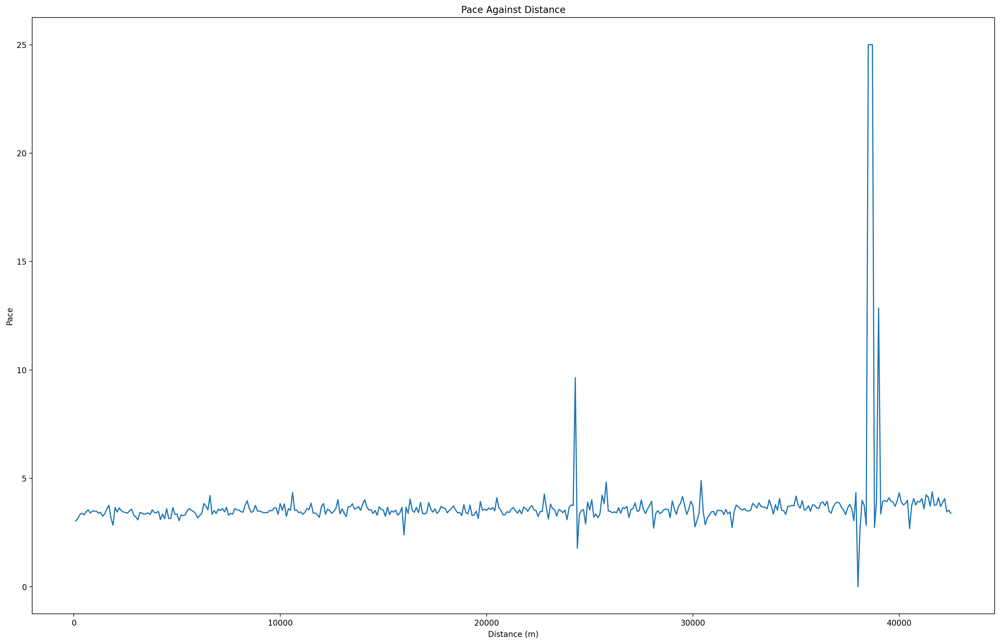

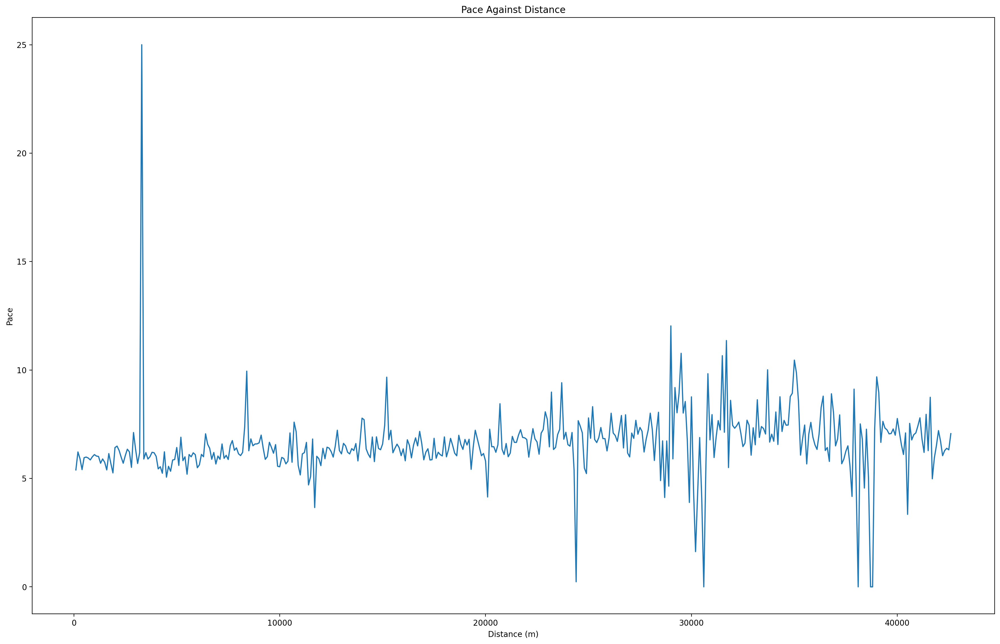

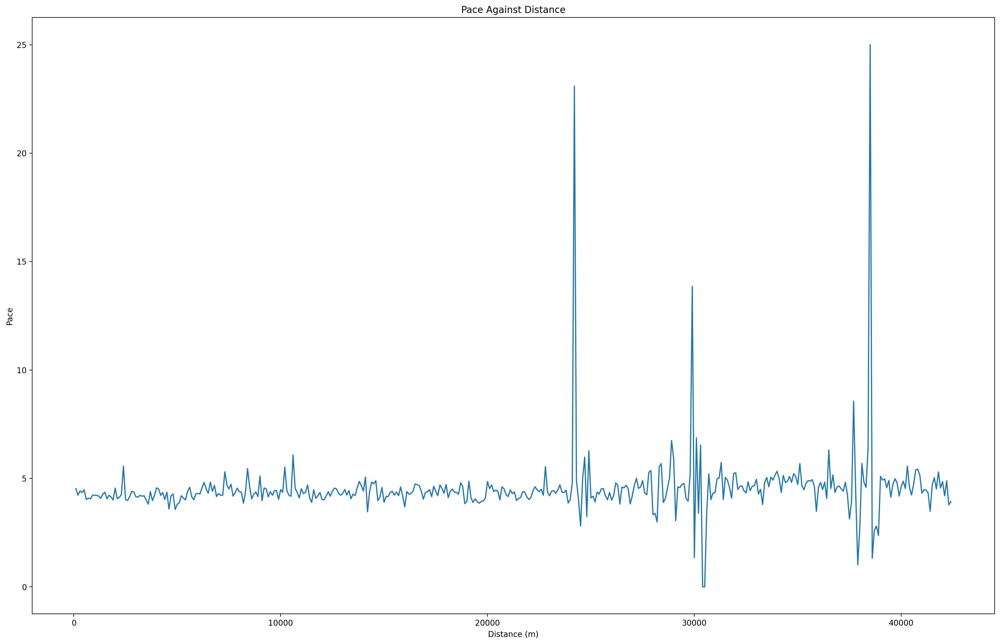

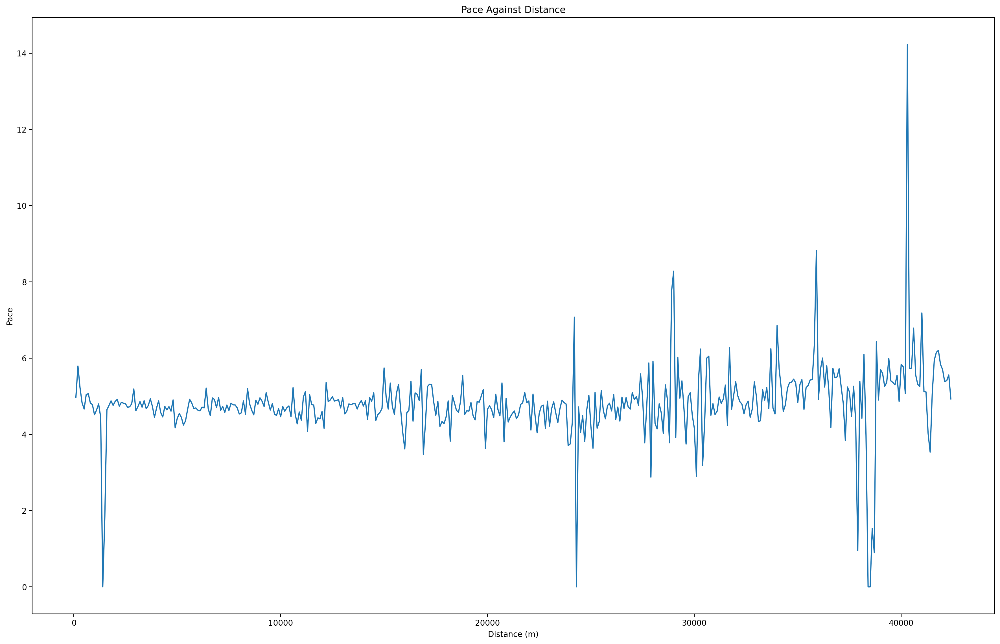

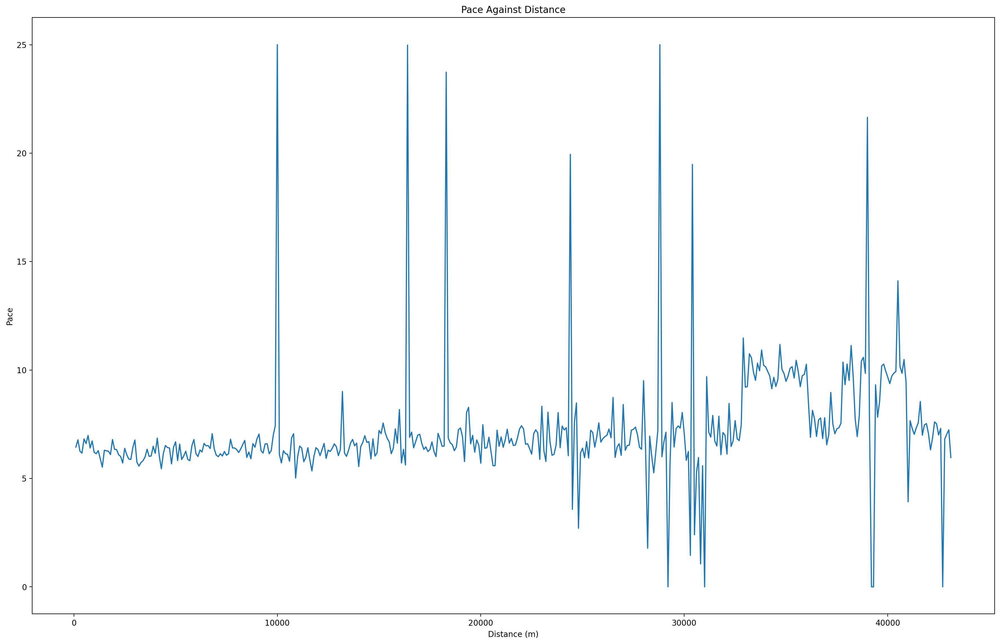

...

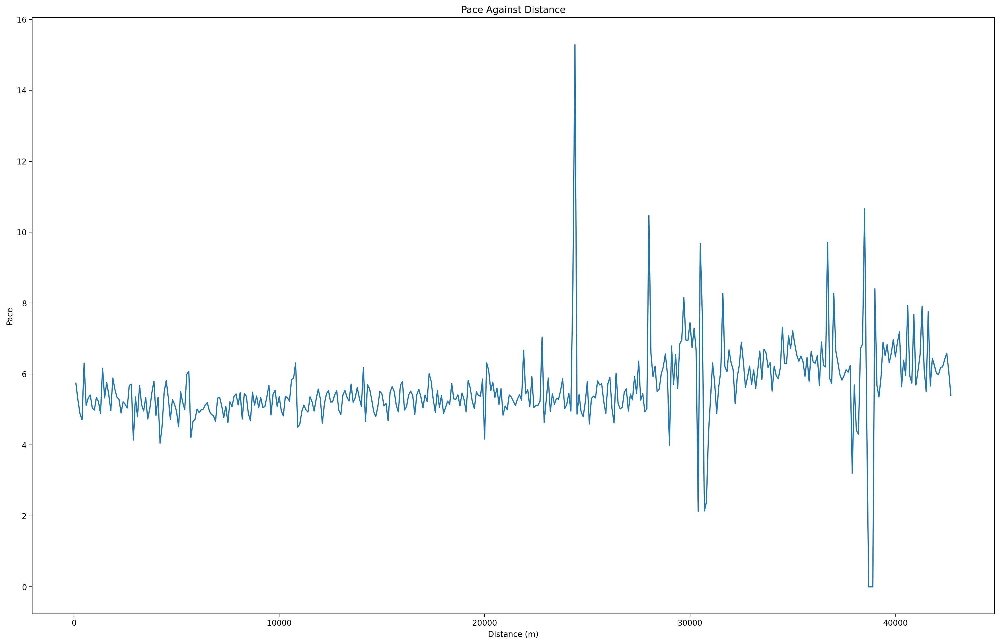

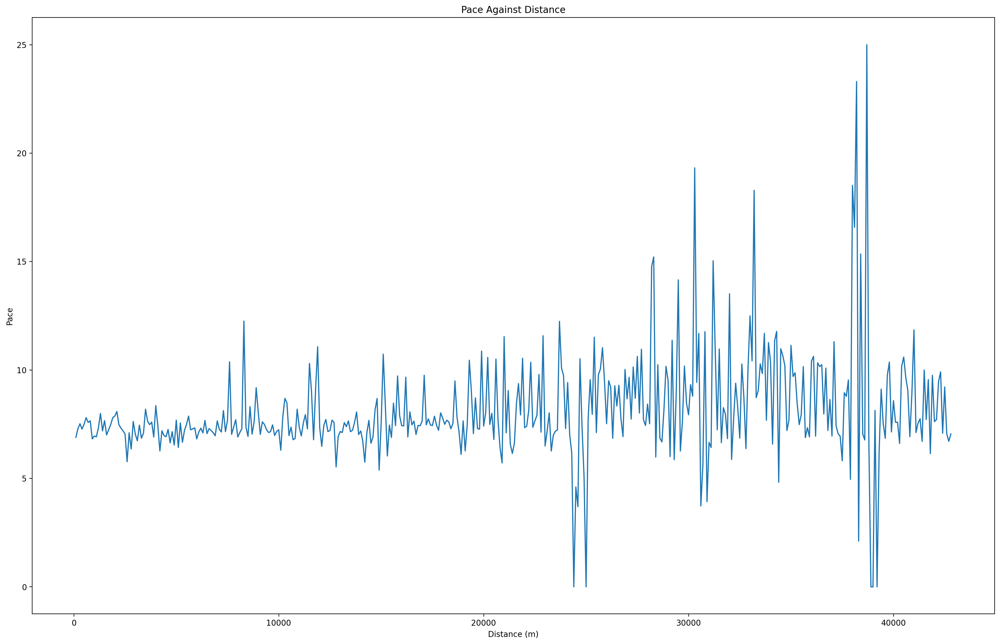

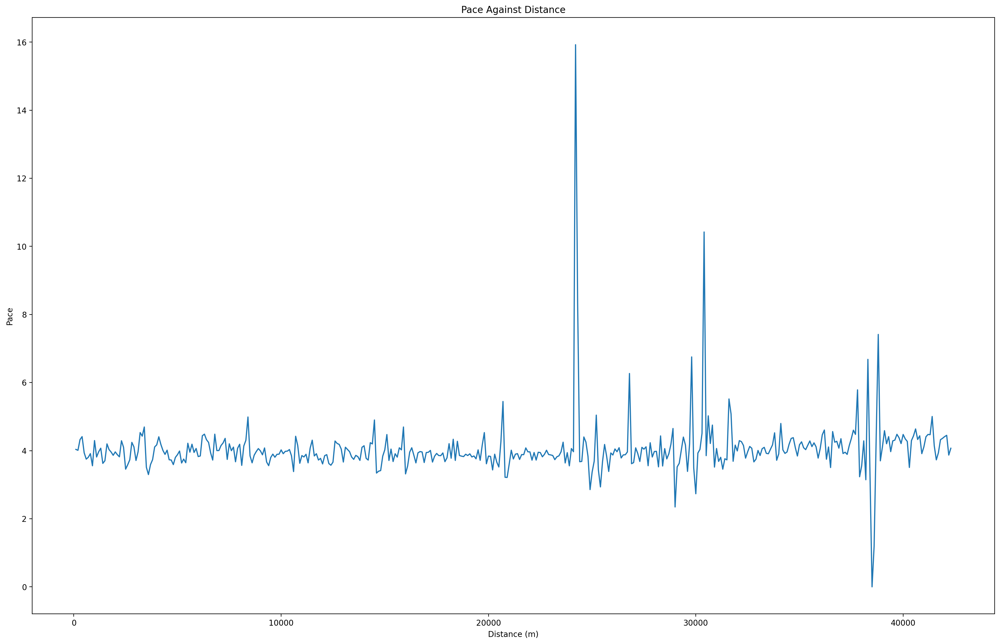

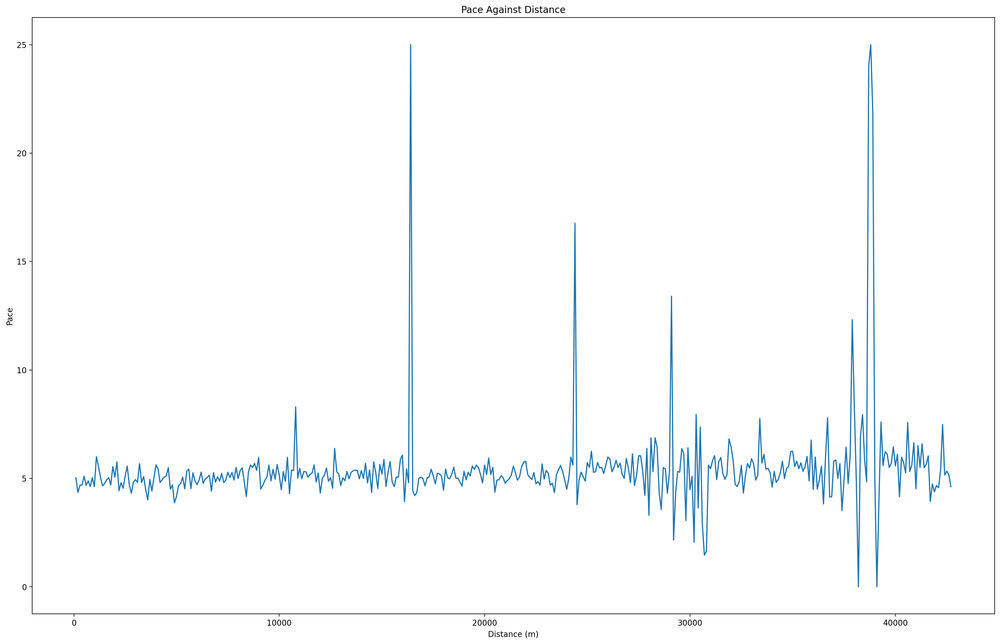

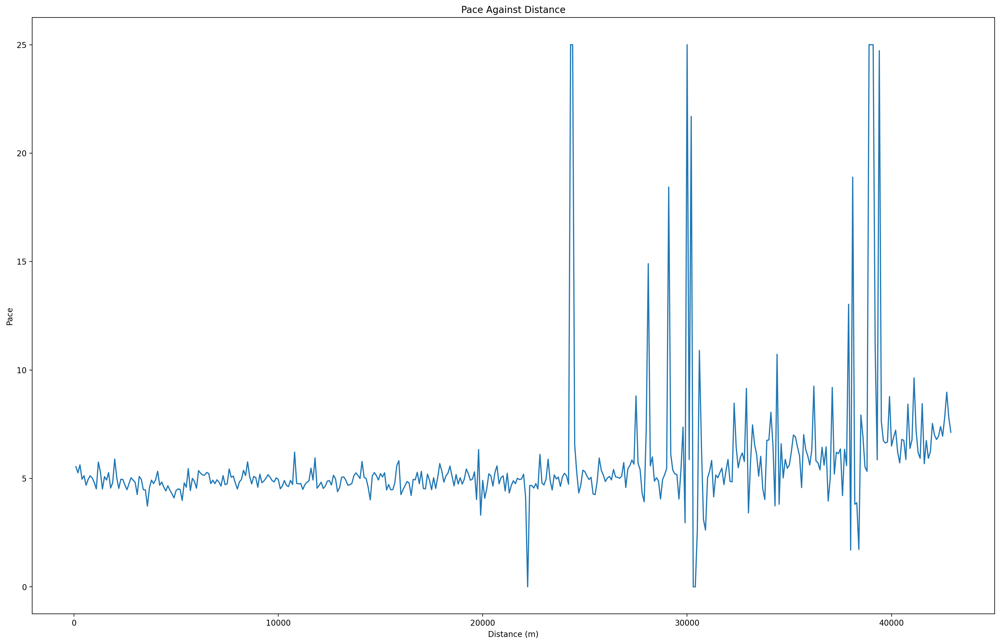

In [9]:
for x in range(60, 100):
    row = pace_distance.iloc[x]
    dist = row['distance_100'][1:]
    
    if (row['pace_diff_100'][2] < 25.0):
        pace = row['pace_diff_100'][1:]
    else:
        continue;

    plt.figure(figsize=(22,14), dpi=200)
    plt.plot(dist, pace)
    plt.title('Pace Against Distance')
    plt.xlabel('Distance (m)')
    plt.ylabel('Pace')
    plt.show()

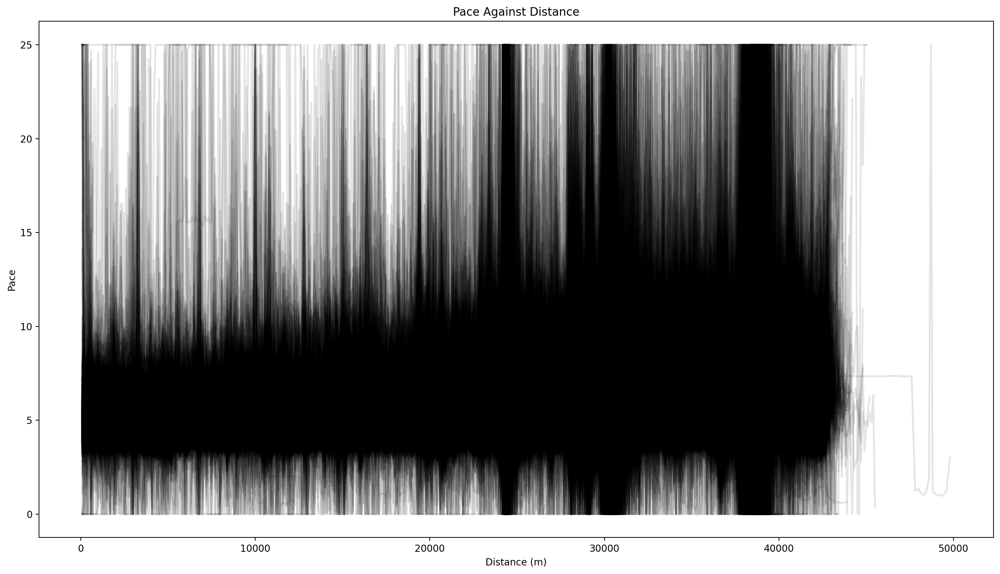

In [10]:
fig = plt.figure(figsize=(18,10), dpi=200)
ax = plt.gca()

for idx, row in df.sample(n=2500, random_state=10).iterrows():
    dist = row['distance_100']
    pace = row['pace_diff_100']
    
    ax.plot(dist[1:], pace[1:], color='black', lw=2, alpha=0.1) #1: = one onwards, lw = line width, alpha = opacity
    
plt.title('Pace Against Distance')
plt.xlabel('Distance (m)')
plt.ylabel('Pace')
plt.show()

In [11]:
len(df)

7004

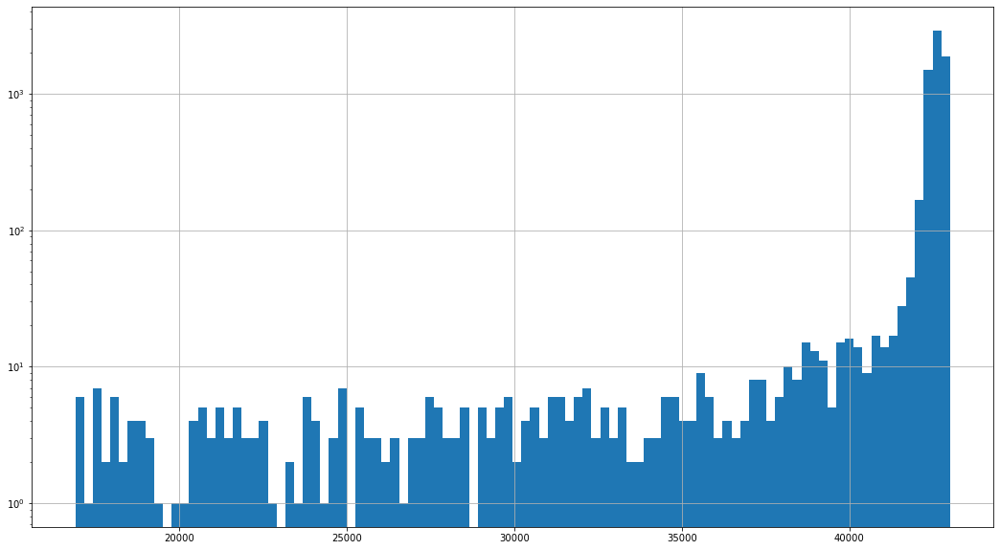

In [12]:
fig = plt.figure(figsize=(18,10))
df['totaldistance'].hist(bins=100)
plt.yscale('log')

In [13]:
from collections import Counter

def count_water_stations(row=None, counter_dist_waterstop=None):
    dist = np.array(row['distance_100'])
    pace = np.array(row['pace_diff_100'])
    ave_pace = pace.mean()
    mask = pace >= 1.1 * ave_pace #slowing down by 10% of avg pace
    
    #display(mask)
    #display(dist[mask], pace[mask])
    #ax.plot(dist[1:], pace[1:], color='black', lw=2, alpha=0.9)

    counter_dist_waterstop.update(dist[mask])
#     for d in dist[mask]:
#         display(d)
#         counter_dist_waterstop.update(d)
        
    return

counter_dist_waterstop = Counter()

for idx, row in df.iterrows():
    count_water_stations(row=row, counter_dist_waterstop=counter_dist_waterstop)

display(counter_dist_waterstop)

Counter({1400.0: 532,
         8300.0: 488,
         8400.0: 1969,
         8800.0: 228,
         10400.0: 749,
         12200.0: 197,
         13600.0: 214,
         14700.0: 555,
         16900.0: 598,
         17600.0: 265,
         18900.0: 491,
         19800.0: 1888,
         19900.0: 1441,
         24100.0: 698,
         24300.0: 3546,
         24400.0: 3045,
         24500.0: 1423,
         25700.0: 1467,
         26800.0: 998,
         27300.0: 1276,
         29100.0: 1517,
         29200.0: 1436,
         29700.0: 2303,
         29900.0: 2199,
         30100.0: 2058,
         30300.0: 2247,
         31500.0: 1431,
         31700.0: 1956,
         32300.0: 1684,
         32700.0: 1570,
         33000.0: 1783,
         33400.0: 2164,
         34200.0: 2142,
         34900.0: 2954,
         35000.0: 2686,
         35100.0: 2314,
         35200.0: 2390,
         36100.0: 2202,
         36200.0: 2298,
         36500.0: 2611,
         36900.0: 2507,
         37100.0: 2695,
        

In [14]:
df_counter = pd.DataFrame.from_dict(counter_dist_waterstop.items())
df_counter.columns = ['dist', 'count']
df_counter

,dist,count
0,1400.0,532
1,8300.0,488
2,8400.0,1969
3,8800.0,228
4,10400.0,749
...,...,...
710,67700.0,1
711,67800.0,1
712,67900.0,1
713,68000.0,1


In [15]:
# print(df_counter['dist'])
print(df_counter.nunique())

dist     715
count    416
dtype: int64


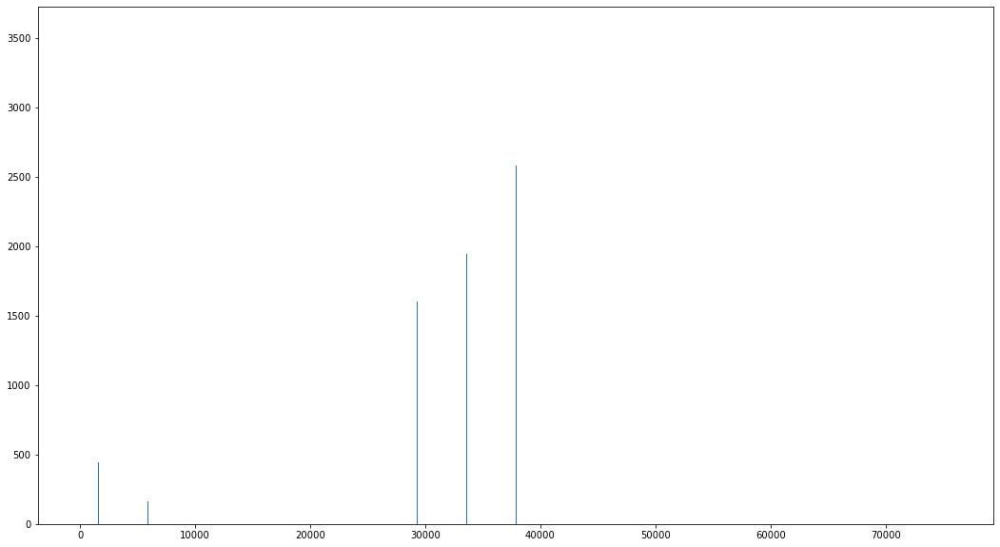

In [16]:
x = df_counter["dist"]
y = df_counter["count"]

plt.figure(figsize=(18,10))
plt.bar(x, y)
plt.show()

# plt.xlabel("Courses offered")
# plt.ylabel("No. of students enrolled")
# plt.title("Students enrolled in different courses")

# ax.set_xticklabels([10000, 20000, 30000, 40000, 50000])

# this is where people are slowing down [potential water stations]
# 10 water station every 2.5 miles (4km)... 4000m

In [17]:
#how much do they slow down by before water stations
ws_slow = []
ws_increase = []

for idx, row in df.sample(n=2500, random_state=10).iterrows():
    pace = np.array(row['pace_diff_100'])

    for i in range(40,420,40):
        #pace at water stations
        try:
            water_station_pace = pace[i]
        except IndexError:
            continue;
            
        #pace 100m before water stations
        try:
            before_station_pace = pace[i-1] 
        except IndexError:
            continue;

        #pace 100m after water stations
        try:
            after_station_pace = pace[i+1] 
        except IndexError:
            continue;

#         print(pace[i]) 
#         print(pace[i-1])
#         print(pace[i+1])

        ws_slow.append(abs(water_station_pace - before_station_pace))
        ws_increase.append(abs(after_station_pace - water_station_pace))

ws_slow = np.array(ws_slow)
ws_increase = np.array(ws_increase)

print("mean slow was {:.4f}".format(ws_slow.mean()))
print("mean increase was {:.4f}".format(ws_increase.mean()))

print("\n")

print("variance slow was {:.4f}".format(ws_slow.var()))
print("variance increase was {:.4f}".format(ws_increase.var()))

mean slow was 0.9209
mean increase was 0.9177


variance slow was 2.4459
variance increase was 2.6507


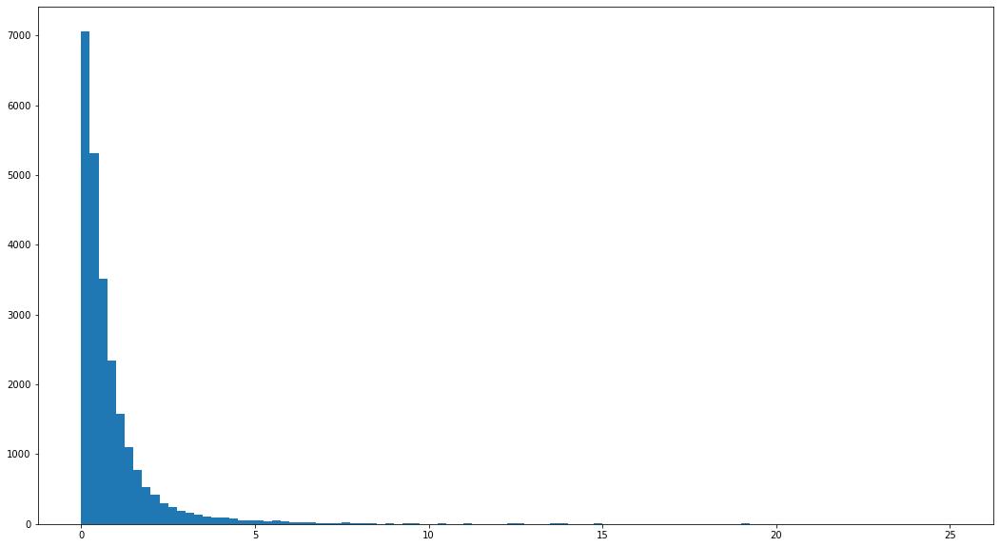

In [18]:
plt.figure(figsize=(18,10))
plt.hist(ws_slow, bins=100)
plt.show()

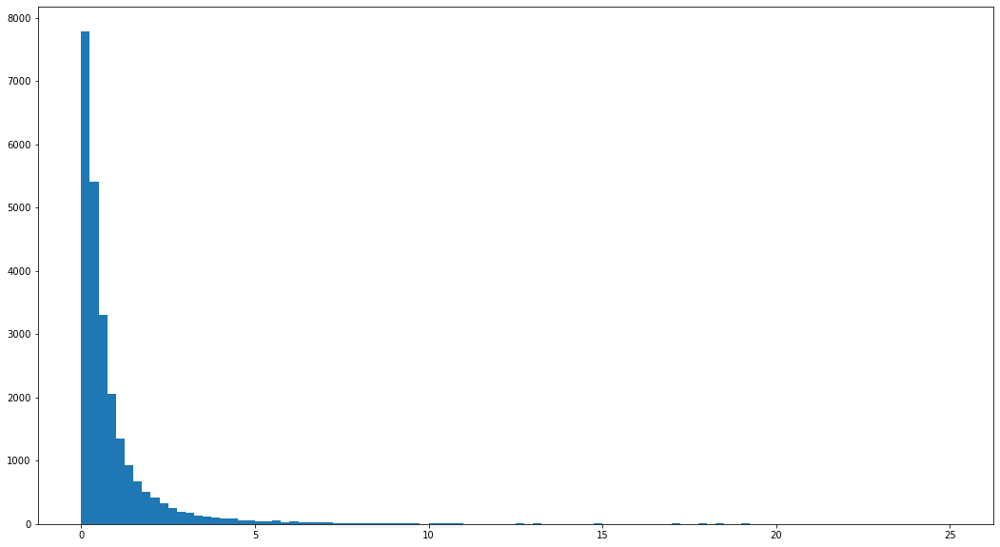

In [19]:
plt.figure(figsize=(18,10))
plt.hist(ws_increase, bins=100)
plt.show()

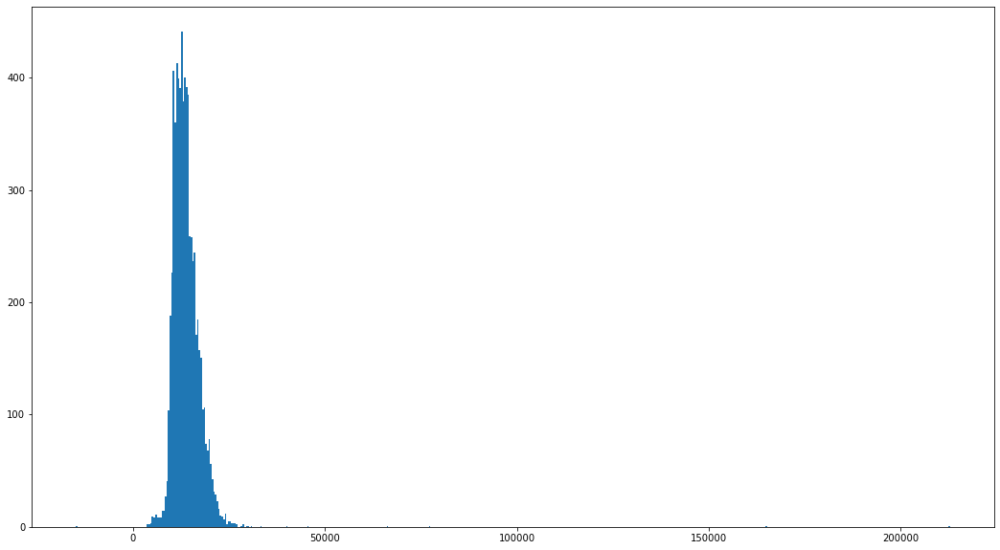

In [20]:
x = df["finish_time"]

plt.figure(figsize=(18,10))
plt.hist(x, bins="auto")
plt.show()

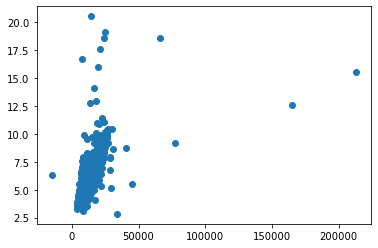

In [21]:
x = df["finish_time"]
y = df["mean_pace"]

plt.scatter(x, y)
plt.show()

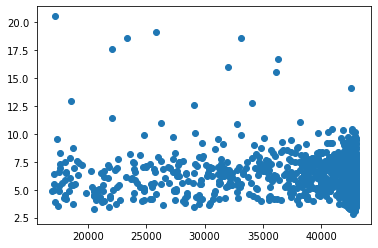

In [22]:
x = df["totaldistance"]
y = df["mean_pace"]

plt.scatter(x, y)
plt.show()
#20k that is half marathon, people stopping

In [23]:
from sklearn.cluster import KMeans
X = np.array(df["mean_pace"])
X = X.reshape(-1,1)

kmeans=KMeans(n_clusters=3)
kmeans.fit_predict(X)
print(kmeans.labels_)

[0 0 0 ... 0 2 0]


In [24]:
df["labels"] = kmeans.labels_
# df.head()

count_arr = np.bincount(kmeans.labels_)

slow= count_arr[0]
fast= count_arr[1]
medium= count_arr[2]

print(fast)
print(medium)
print(slow)

#len(df)
#len(kmeans.labels_)

1130
2882
2992


In [25]:
df.head()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100,mean_pace,finish_time,expected_finish,time_diff,status,labels
0,95ddefe02c667abc7e449159804acdadd33ab690767e60...,9476162dd80f399d8b8019fe3c33d86ab324ba652be562...,2017-04-23 10:01:47,42987.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 34.039024, 64.84619, 94.783936, 123.9860...","[42.7, 44.000004, 44.231876, 43.991158, 44.148...",[],"[124.0, 165.06412, 172.00883, 189.06175, 184.5...","[1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...","[25.0, 5.67318, 5.403746, 5.265825, 5.166199, ...","[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",5.028993,12834.468,12733.409304,101.058696,1,0
1,95e238205210d9410e4fe0ecbab3df223313340a83f3ab...,1d451ca69475b02a540536e6d8303ff0e9a2189fc603af...,2017-04-23 10:02:22,42436.4,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 23.38406, 48.982754, 75.6115, 102.20331,...","[44.2, 44.509953, 43.50354, 42.902058, 42.7556...","[62.0, 100.199394, 96.13578, 96.58066, 95.7775...",[],"[1e-05, 4.088528, 4.540111, 4.395275, 4.337309...","[25.0, 3.896713, 4.082259, 4.200669, 4.258449,...","[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",4.432703,10829.543,11223.602894,-394.059894,1,0
6,95eba9b4eb1b8bfcfe14b0215156ea10e3d0a4d50d7be1...,1c6c6576c3ee782a9c3e8d08bf4818eb82085981216a22...,2017-04-23 10:04:41,42552.3,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 28.140812, 56.60887, 85.458954, 111.4738...","[45.0, 44.50024, 43.513416, 42.891914, 42.7582...","[77.0, 81.17224, 81.07842, 83.13461, 85.07627,...","[116.0, 139.33345, 146.87625, 153.8891, 148.48...","[1e-05, 4.942587, 4.808361, 4.425655, 4.20174,...","[25.0, 4.690524, 4.717237, 4.747717, 4.64474, ...","[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",4.532007,11797.368,11475.042419,322.325581,1,0
7,95ed08604c232c1f31e1cbe9c231ec98134cdf0626c18a...,7763b28bebd7085448a8ee75af2632cd09e71f9bc54db5...,2017-04-23 10:03:59,42479.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 31.795603, 64.73096, 97.47005, 131.10153...","[44.4, 44.03507, 44.025215, 44.00508, 44.08392...","[88.0, 86.194084, 84.06168, 84.231834, 86.4729...","[103.0, 102.46857, 103.18167, 105.85084, 106.7...","[1e-05, 5.090441, 5.792316, 5.400458, 5.497332...","[25.0, 5.319232, 5.394427, 5.414787, 5.462709,...","[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",5.294962,13615.677,13406.842645,208.834355,1,2
8,9606a9c0f278fff6d786b33527d63baed662c1d181b990...,500d7bc966f11ef0b13d6a6fec36c38f756b24faab1d9e...,2017-04-23 10:22:53,42921.0,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 40.166206, 82.80859, 128.99088, 173.7834...","[44.9, 44.50008, 43.497475, 42.9, 42.782135, 4...",[],[],"[1e-05, 6.79587, 7.137154, 7.659541, 7.051615,...","[25.0, 6.694364, 6.900718, 7.16616, 7.240978, ...","[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",6.817974,17806.332,17263.109655,543.222345,1,1


In [26]:
 df["status"].value_counts()

1    6326
0     678
Name: status, dtype: int64

In [27]:
 df["labels"].value_counts()

0    2992
2    2882
1    1130
Name: labels, dtype: int64

In [28]:
# print(X.shape)

In [29]:
centroids = kmeans.cluster_centers_
centroids

array([[4.46101826],
       [7.51876027],
       [5.75530198]])

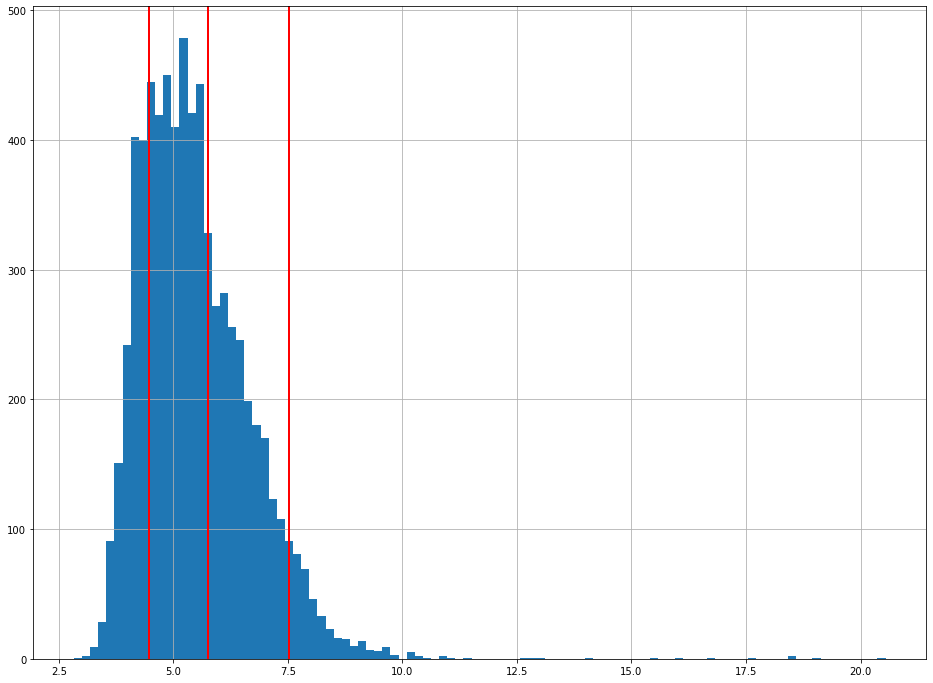

In [30]:
df.mean_pace.hist(bins=100, figsize=(16,12))
plt.axvline(x=centroids[0],lw=2,c='red')
plt.axvline(x=centroids[1],lw=2,c='red')
plt.axvline(x=centroids[2],lw=2,c='red')

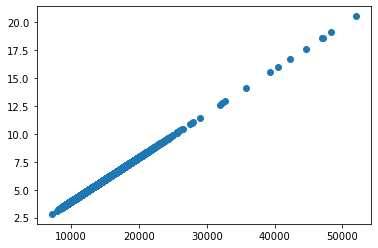

In [31]:
x = df["expected_finish"]
y = df["mean_pace"]

plt.scatter(x, y)
plt.show()

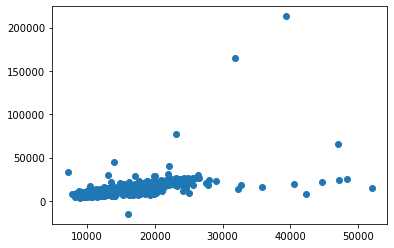

In [32]:
x = df["expected_finish"]
y = df["finish_time"]

plt.scatter(x, y)
plt.show()

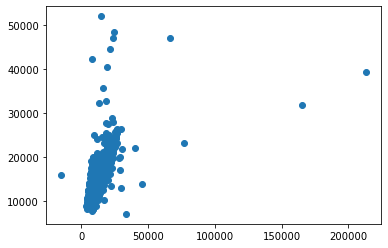

In [33]:
x = df["finish_time"]
y = df["expected_finish"]


plt.scatter(x, y)
plt.show()

In [34]:
# reprinting df head for convenience 
df.head()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100,mean_pace,finish_time,expected_finish,time_diff,status,labels
0,95ddefe02c667abc7e449159804acdadd33ab690767e60...,9476162dd80f399d8b8019fe3c33d86ab324ba652be562...,2017-04-23 10:01:47,42987.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 34.039024, 64.84619, 94.783936, 123.9860...","[42.7, 44.000004, 44.231876, 43.991158, 44.148...",[],"[124.0, 165.06412, 172.00883, 189.06175, 184.5...","[1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...","[25.0, 5.67318, 5.403746, 5.265825, 5.166199, ...","[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",5.028993,12834.468,12733.409304,101.058696,1,0
1,95e238205210d9410e4fe0ecbab3df223313340a83f3ab...,1d451ca69475b02a540536e6d8303ff0e9a2189fc603af...,2017-04-23 10:02:22,42436.4,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 23.38406, 48.982754, 75.6115, 102.20331,...","[44.2, 44.509953, 43.50354, 42.902058, 42.7556...","[62.0, 100.199394, 96.13578, 96.58066, 95.7775...",[],"[1e-05, 4.088528, 4.540111, 4.395275, 4.337309...","[25.0, 3.896713, 4.082259, 4.200669, 4.258449,...","[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",4.432703,10829.543,11223.602894,-394.059894,1,0
6,95eba9b4eb1b8bfcfe14b0215156ea10e3d0a4d50d7be1...,1c6c6576c3ee782a9c3e8d08bf4818eb82085981216a22...,2017-04-23 10:04:41,42552.3,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 28.140812, 56.60887, 85.458954, 111.4738...","[45.0, 44.50024, 43.513416, 42.891914, 42.7582...","[77.0, 81.17224, 81.07842, 83.13461, 85.07627,...","[116.0, 139.33345, 146.87625, 153.8891, 148.48...","[1e-05, 4.942587, 4.808361, 4.425655, 4.20174,...","[25.0, 4.690524, 4.717237, 4.747717, 4.64474, ...","[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",4.532007,11797.368,11475.042419,322.325581,1,0
7,95ed08604c232c1f31e1cbe9c231ec98134cdf0626c18a...,7763b28bebd7085448a8ee75af2632cd09e71f9bc54db5...,2017-04-23 10:03:59,42479.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 31.795603, 64.73096, 97.47005, 131.10153...","[44.4, 44.03507, 44.025215, 44.00508, 44.08392...","[88.0, 86.194084, 84.06168, 84.231834, 86.4729...","[103.0, 102.46857, 103.18167, 105.85084, 106.7...","[1e-05, 5.090441, 5.792316, 5.400458, 5.497332...","[25.0, 5.319232, 5.394427, 5.414787, 5.462709,...","[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",5.294962,13615.677,13406.842645,208.834355,1,2
8,9606a9c0f278fff6d786b33527d63baed662c1d181b990...,500d7bc966f11ef0b13d6a6fec36c38f756b24faab1d9e...,2017-04-23 10:22:53,42921.0,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 40.166206, 82.80859, 128.99088, 173.7834...","[44.9, 44.50008, 43.497475, 42.9, 42.782135, 4...",[],[],"[1e-05, 6.79587, 7.137154, 7.659541, 7.051615,...","[25.0, 6.694364, 6.900718, 7.16616, 7.240978, ...","[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",6.817974,17806.332,17263.109655,543.222345,1,1


In [35]:
plotThis = df.groupby('labels', as_index=False)['mean_pace'].mean()

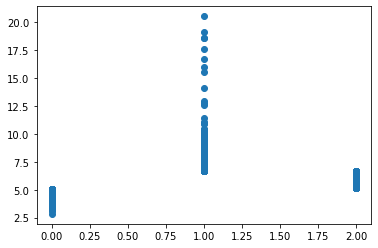

In [36]:
x = df["labels"]
y = df["mean_pace"]

plt.scatter(x, y)
plt.show()

<AxesSubplot:ylabel='Frequency'>

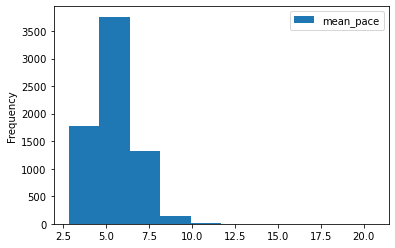

In [37]:
df.plot( x='labels', y='mean_pace', kind='hist')

In [38]:
len(mean_pace)

7004

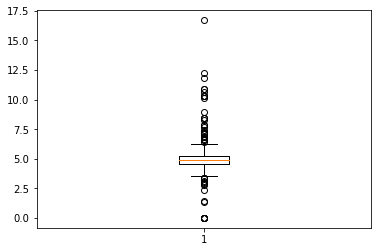

In [39]:
dist=df["distance_100"]
pace=df["pace_diff_100"]

pace_0_=pace.iloc[0]
pace_0=pd.DataFrame(pace_0_,columns=['Pace_0'])
#print(pace_0_)

#boxplot of paces of one runner
import matplotlib.pyplot as plt
box=plt.boxplot(pace_0)

In [40]:
# finding the 1st quartile
q1 = np.quantile(pace_0_, 0.25)
 
# finding the 3rd quartile
q3 = np.quantile(pace_0_, 0.75)
med = np.median(pace_0_)
 
# finding the iqr region
iqr = q3-q1
 
# finding upper and lower whiskers
upper_bound = q3+(1.5*iqr)
lower_bound = q1-(1.5*iqr)

In [41]:
#finding indexes for outliers 
outliers=[]
for i in range(len(pace_0_)):
    if pace_0_[i]>upper_bound:
        outliers.append(i)
print(outliers)

[88, 198, 199, 243, 244, 245, 273, 291, 292, 299, 317, 330, 334, 349, 350, 351, 352, 361, 369, 376, 380, 381, 387, 395, 405, 407, 408, 412, 413, 415, 419]


In [42]:
#finding distances of those indexes
dist_0=np.array(dist.iloc[0])
dist_stop=dist_0[np.array(outliers).astype(int)]
print(dist_stop)

[ 8800. 19800. 19900. 24300. 24400. 24500. 27300. 29100. 29200. 29900.
 31700. 33000. 33400. 34900. 35000. 35100. 35200. 36100. 36900. 37600.
 38000. 38100. 38700. 39500. 40500. 40700. 40800. 41200. 41300. 41500.
 41900.]


In [43]:
df.head()

,hashedid,hashedathleteid,startdatelocal,totaldistance,city_name,country_code,distance_100,time_100,elevation_100,cadence_100,heartrate_100,pace_diff_100,pace_cumul_100,gap_100,mean_pace,finish_time,expected_finish,time_diff,status,labels
0,95ddefe02c667abc7e449159804acdadd33ab690767e60...,9476162dd80f399d8b8019fe3c33d86ab324ba652be562...,2017-04-23 10:01:47,42987.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 34.039024, 64.84619, 94.783936, 123.9860...","[42.7, 44.000004, 44.231876, 43.991158, 44.148...",[],"[124.0, 165.06412, 172.00883, 189.06175, 184.5...","[1e-05, 5.486274, 5.23594, 5.017931, 4.783493,...","[25.0, 5.67318, 5.403746, 5.265825, 5.166199, ...","[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",5.028993,12834.468,12733.409304,101.058696,1,0
1,95e238205210d9410e4fe0ecbab3df223313340a83f3ab...,1d451ca69475b02a540536e6d8303ff0e9a2189fc603af...,2017-04-23 10:02:22,42436.4,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 23.38406, 48.982754, 75.6115, 102.20331,...","[44.2, 44.509953, 43.50354, 42.902058, 42.7556...","[62.0, 100.199394, 96.13578, 96.58066, 95.7775...",[],"[1e-05, 4.088528, 4.540111, 4.395275, 4.337309...","[25.0, 3.896713, 4.082259, 4.200669, 4.258449,...","[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",4.432703,10829.543,11223.602894,-394.059894,1,0
6,95eba9b4eb1b8bfcfe14b0215156ea10e3d0a4d50d7be1...,1c6c6576c3ee782a9c3e8d08bf4818eb82085981216a22...,2017-04-23 10:04:41,42552.3,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 28.140812, 56.60887, 85.458954, 111.4738...","[45.0, 44.50024, 43.513416, 42.891914, 42.7582...","[77.0, 81.17224, 81.07842, 83.13461, 85.07627,...","[116.0, 139.33345, 146.87625, 153.8891, 148.48...","[1e-05, 4.942587, 4.808361, 4.425655, 4.20174,...","[25.0, 4.690524, 4.717237, 4.747717, 4.64474, ...","[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",4.532007,11797.368,11475.042419,322.325581,1,0
7,95ed08604c232c1f31e1cbe9c231ec98134cdf0626c18a...,7763b28bebd7085448a8ee75af2632cd09e71f9bc54db5...,2017-04-23 10:03:59,42479.1,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 31.795603, 64.73096, 97.47005, 131.10153...","[44.4, 44.03507, 44.025215, 44.00508, 44.08392...","[88.0, 86.194084, 84.06168, 84.231834, 86.4729...","[103.0, 102.46857, 103.18167, 105.85084, 106.7...","[1e-05, 5.090441, 5.792316, 5.400458, 5.497332...","[25.0, 5.319232, 5.394427, 5.414787, 5.462709,...","[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",5.294962,13615.677,13406.842645,208.834355,1,2
8,9606a9c0f278fff6d786b33527d63baed662c1d181b990...,500d7bc966f11ef0b13d6a6fec36c38f756b24faab1d9e...,2017-04-23 10:22:53,42921.0,london,gb,"[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0...","[0.0, 40.166206, 82.80859, 128.99088, 173.7834...","[44.9, 44.50008, 43.497475, 42.9, 42.782135, 4...",[],[],"[1e-05, 6.79587, 7.137154, 7.659541, 7.051615,...","[25.0, 6.694364, 6.900718, 7.16616, 7.240978, ...","[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",6.817974,17806.332,17263.109655,543.222345,1,1


In [44]:
for col in df.columns:
    print(col)

hashedid
hashedathleteid
startdatelocal
totaldistance
city_name
country_code
distance_100
time_100
elevation_100
cadence_100
heartrate_100
pace_diff_100
pace_cumul_100
gap_100
mean_pace
finish_time
expected_finish
time_diff
status
labels


In [45]:
new_df = df[["gap_100", "status"]]
new_df.head()

,gap_100,status
0,"[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",1
1,"[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",1
6,"[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",1
7,"[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",1
8,"[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",1


In [46]:
# for idx, row in new_df.iterrows():
# #     time = row['time_100']
# #     elev = row['elevation_100']
#     gap = row['gap_100']
    
# #     if not (len(time) == len(elev) and len(time) == len(gap)):
# #         print("Row ", idx, " Not equal")
# #     print(len(time), ", ", len(elev), ", ", len(gap))

# #     time = time[:190]
# #     elev = elev[:190]
#     gap = gap[:190]
    
# #     new_df.at[idx, 'time_100'] = time
# #     new_df.at[idx, 'elevation_100'] = elev
#     new_df.at[idx, 'gap_100'] = gap
# # print(len(new_df.at[0, 'gap_100']))

In [47]:
new_df.head()

,gap_100,status
0,"[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",1
1,"[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",1
6,"[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",1
7,"[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",1
8,"[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",1


In [48]:
mean_gap = []
gap_var = []
gap_std = []

for idx, row in new_df.iterrows():
    gap = np.array(row['gap_100'])
    gap = gap[:190]
    new_df.at[idx, 'gap_100'] = gap
    
    mean_gap.append(gap.mean())
    gap_var.append(gap.var())
    gap_std.append(gap.std())
    
new_df["mean_gap"] = mean_gap
new_df["gap_var"] = gap_var
new_df["gap_std"] = gap_std

new_df.head()

<ipython-input-48-902be153262d>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df["mean_gap"] = mean_gap
<ipython-input-48-902be153262d>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df["gap_var"] = gap_var
<ipython-input-48-902be153262d>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

,gap_100,status,mean_gap,gap_var,gap_std
0,"[0.0, 5.115103, 5.170641, 5.08384, 4.742967, 4...",1,4.872373,0.728121,0.853300
1,"[0.0, 4.020532, 4.795212, 4.541101, 4.371863, ...",1,4.235340,0.364468,0.603712
6,"[0.0, 5.078423, 5.073122, 4.577466, 4.232293, ...",1,4.563433,0.434231,0.658962
7,"[0.0, 5.192183, 5.795409, 5.406351, 5.473912, ...",1,5.383952,0.536587,0.732521
8,"[0.0, 6.944879, 7.536617, 7.911943, 7.096798, ...",1,6.945427,1.524528,1.234718


In [49]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score, recall_score

In [50]:
X = new_df[["mean_gap","gap_var","gap_std"]]
y = new_df["status"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [51]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier(n_estimators=5000, learning_rate=0.01, max_depth=6, random_state=1).fit(X_train, y_train)
# gbc.score(X_test, y_test)

In [52]:
setattr (gbc, 'scale_pos_weight', 4) # assuming 80:20 ratio

In [53]:
y_predicted = gbc.predict(X_test)
print(y_predicted.sum())

2000


In [54]:
len(y_predicted)

2102

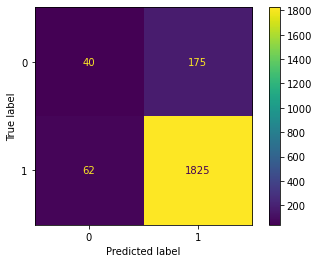

In [55]:
plot_confusion_matrix(gbc, X_test, y_test)

In [56]:
# accuracy = accuracy_score(y_test, y_predicted)
# precision = precision_score(y_test, y_predicted, pos_label=1)
# recall = recall_score(y_test, y_predicted, pos_label=1)

sens = classification_report(y_test, y_predicted)
# spec = 

print(sens)
# print(f"Accuracy: {accuracy:.3f}")
# print(f"Precision score: {precision:.3f}")
# print(f"Recall score: {recall:.3f}")

              precision    recall  f1-score   support

           0       0.39      0.19      0.25       215
           1       0.91      0.97      0.94      1887

    accuracy                           0.89      2102
   macro avg       0.65      0.58      0.60      2102
weighted avg       0.86      0.89      0.87      2102



In [57]:
# 'kernel' parameter Specifies the kernel type to be used in the algorithm
from sklearn.svm import SVC

svc = SVC(kernel='rbf', class_weight='balanced')
svc.fit(X_train, y_train)

SVC(class_weight='balanced')

In [58]:
y_predicted = svc.predict(X_test)

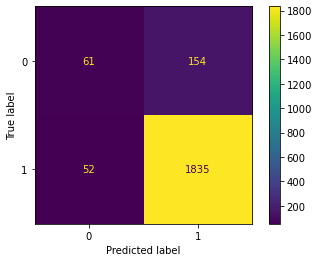

In [59]:
plot_confusion_matrix(svc, X_test, y_test)

In [60]:
accuracy = accuracy_score(y_test, y_predicted)
precision = precision_score(y_test, y_predicted, pos_label=1)
recall = recall_score(y_test, y_predicted, pos_label=1)

print(f"Accuracy: {accuracy:.3f}")
print(f"Precision score: {precision:.3f}")
print(f"Recall score: {recall:.3f}")

Accuracy: 0.902
Precision score: 0.923
Recall score: 0.972


In [61]:
log_regressor = LogisticRegression(solver='liblinear', random_state=1).fit(X_train, y_train)
y_predicted = log_regressor.predict(X_test)

actual_vs_predicted = pd.concat([y_test, pd.DataFrame(y_predicted, columns=['Predicted'], index=y_test.index)], axis=1)
actual_vs_predicted.head()

,status,Predicted
3701,1,1
6974,1,1
2725,1,1
7453,1,1
6682,1,1


In [62]:
print("\nCoeficients: \n", log_regressor.coef_)
print("\nIntercept: \n", log_regressor.intercept_)
print('\nNumber of features seen during fit:', log_regressor.n_features_in_)


Coeficients: 
 [[-0.12699734  0.01307475 -1.1194987 ]]

Intercept: 
 [4.15716112]

Number of features seen during fit: 3


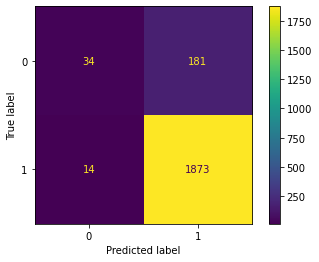

In [63]:
plot_confusion_matrix(log_regressor, X_test, y_test)

In [64]:
accuracy = accuracy_score(y_test, y_predicted)
precision = precision_score(y_test, y_predicted, pos_label=1)
recall = recall_score(y_test, y_predicted, pos_label=1)

print(f"Accuracy: {accuracy:.3f}")
print(f"Precision score: {precision:.3f}")
print(f"Recall score: {recall:.3f}")

Accuracy: 0.907
Precision score: 0.912
Recall score: 0.993


In [65]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier() 
knn_clf.fit(X_train, y_train)

KNeighborsClassifier()

In [66]:
# predict on the training dataset 
y_predicted = knn_clf.predict(X_train)
accuracy_score(y_train, y_predicted)

0.9208486332109344

In [67]:
y_predicted = knn_clf.predict(X_test)
accuracy_score(y_test, y_predicted)

0.8967649857278782

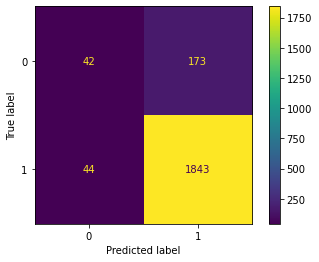

In [68]:
plot_confusion_matrix(knn_clf, X_test, y_test)

In [69]:
accuracy = accuracy_score(y_test, y_predicted)
precision = precision_score(y_test, y_predicted, pos_label=1)
recall = recall_score(y_test, y_predicted, pos_label=1)

print(f"Accuracy: {accuracy:.3f}")
print(f"Precision score: {precision:.3f}")
print(f"Recall score: {recall:.3f}")

Accuracy: 0.897
Precision score: 0.914
Recall score: 0.977


In [70]:
from sklearn.naive_bayes import GaussianNB

In [71]:
gnb_clf = GaussianNB()
gnb_clf.fit(X_train, y_train)

GaussianNB()

In [72]:
#cpredict on the training dataset 
y_predicted = gnb_clf.predict(X_train)
accuracy_score(y_train, y_predicted)

0.9130966952264382

In [73]:
# predict if an individual's credit risk performance isgood or bad on the test data using Naive Bayes model
y_predicted = gnb_clf.predict(X_test)
accuracy_score(y_test, y_predicted)

0.9086584205518554

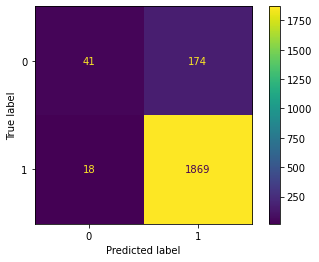

In [74]:
plot_confusion_matrix(gnb_clf, X_test, y_test)

In [75]:
accuracy = accuracy_score(y_test, y_predicted)
precision = precision_score(y_test, y_predicted, pos_label=1)
recall = recall_score(y_test, y_predicted, pos_label=1)

print(f"Accuracy: {accuracy:.3f}")
print(f"Precision score: {precision:.3f}")
print(f"Recall score: {recall:.3f}")

Accuracy: 0.909
Precision score: 0.915
Recall score: 0.990


In [76]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [77]:
dtc = DecisionTreeClassifier(criterion='entropy', max_depth=3)
dtc.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3)

In [78]:
# predict on the training dataset 
y_predicted = dtc.predict(X_train)
accuracy_score(y_train, y_predicted)

0.9122807017543859

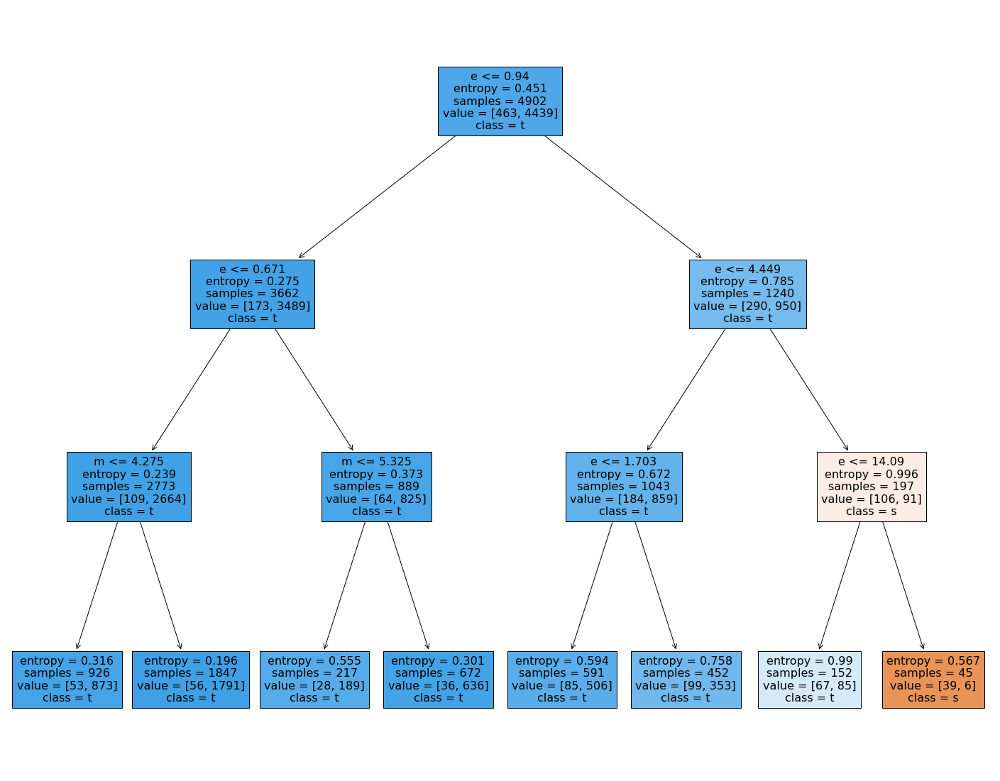

In [79]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dtc, 
                   feature_names= "mean_gap",  
                   class_names= "status",
                   filled=True)  

In [80]:
# predict if an individual's credit risk performance isgood or bad on the test data using Decision Tree model
y_predicted = dtc.predict(X_test)
accuracy_score(y_test, y_predicted)

0.9034253092293054

In [81]:
accuracy = accuracy_score(y_test, y_predicted)
precision = precision_score(y_test, y_predicted, pos_label=1)
recall = recall_score(y_test, y_predicted, pos_label=1)

print(f"Accuracy: {accuracy:.3f}")
print(f"Precision score: {precision:.3f}")
print(f"Recall score: {recall:.3f}")

Accuracy: 0.903
Precision score: 0.907
Recall score: 0.994
